# L05 21/03/24

# Object recognition

## Object instance Recognition

We want to precisely localize where the object is in the image

## Template matching
it's the intuitive approach, but computationally inefficient, we have to try all the possible combinations of locations, scale, roations etc.

##  Matching with filters 

#### (SSD, Sum of Squared Differences):

$$h[m,n] = \sum_{k,l}(g[k,l]-f[m+k,n+l])^2$$

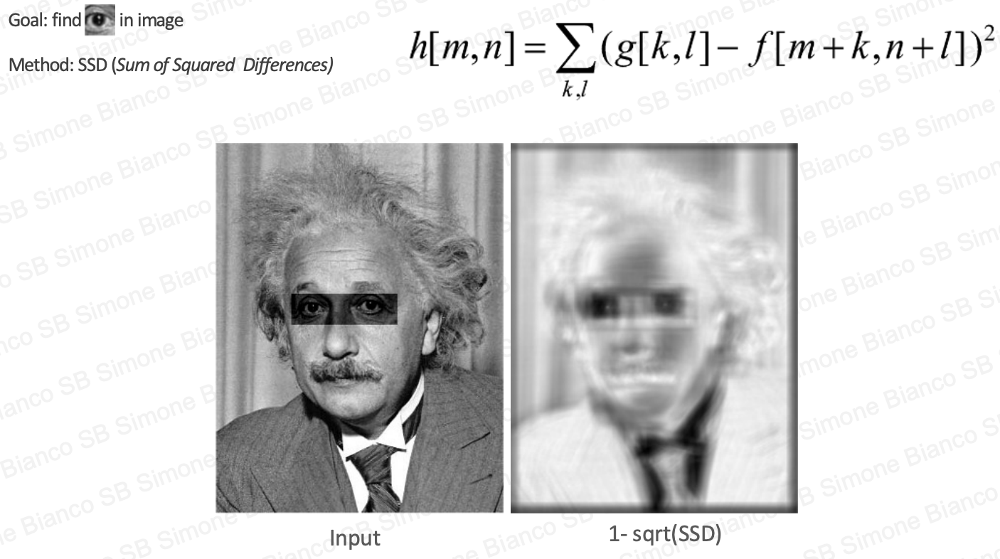

### Normalized Cross-correlation

$$h[m,n] = \frac{\sum_{k,l}(g[k,l]-\overline{g}) (f[m-k,n-l]-\overline{f}_{m,n})}{\sum_{k.l}(g[k,l]-\overline{g})^2 \sum_{k,l}(f[m-k,n-l] - \overline{f}_{m,n})^2}$$

More computationally expensive since you have to recompute every time the mean of the patch

SSD:
- faster
- Sensitive to overall intensity  

Normalized cross-correlation:
- Slower, invariant to local average intensity
- invariant to local contrast

### Template Matching: Sliding window

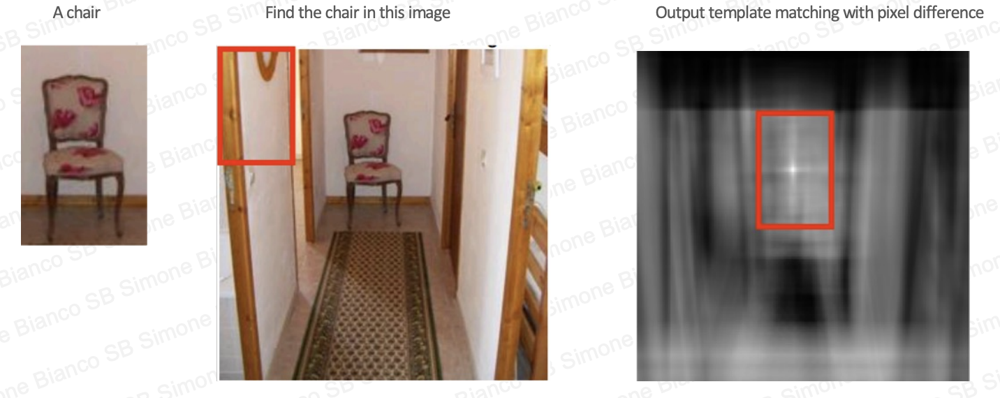

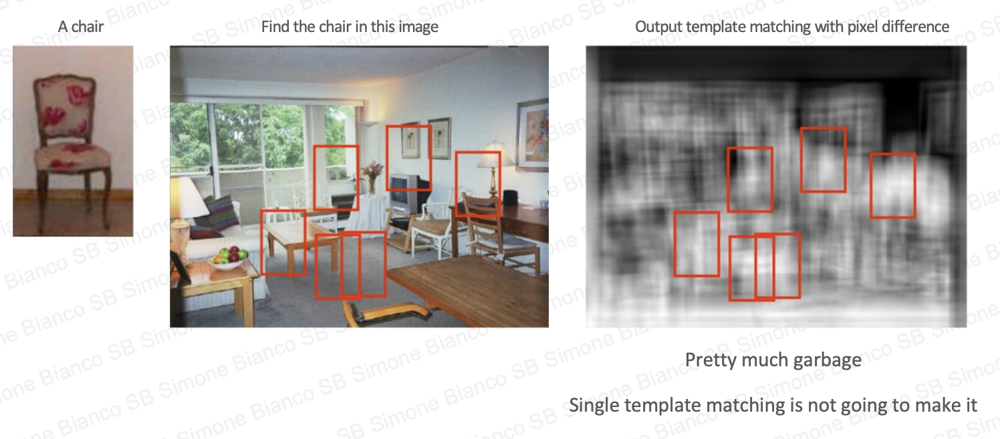

## Variability problems:

- Scale, translation
- Rotation
- Illumination
  - Intensity
  - Direction
  - Color
- Image quality

## Local descriptor, I compare once my information with the local information

#### History:

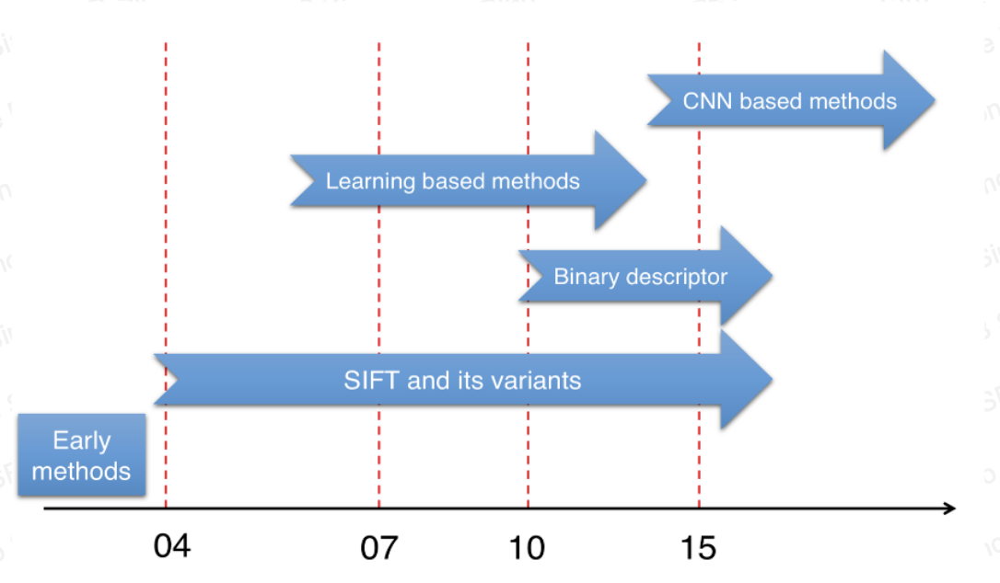

# Sift and Surf: classic local features

## Sift: Scale Invariant Feature Transform
- it was patented in Canada
## Surf Speeded Robust Features
- 3-7 times faster than sift, with similar matching performance
- included in OpenCV

# Keypoints-Based Approaches

Both the local fatures seen above are **keypoints based**, because when geometric recovery matters, they remain unequaled.

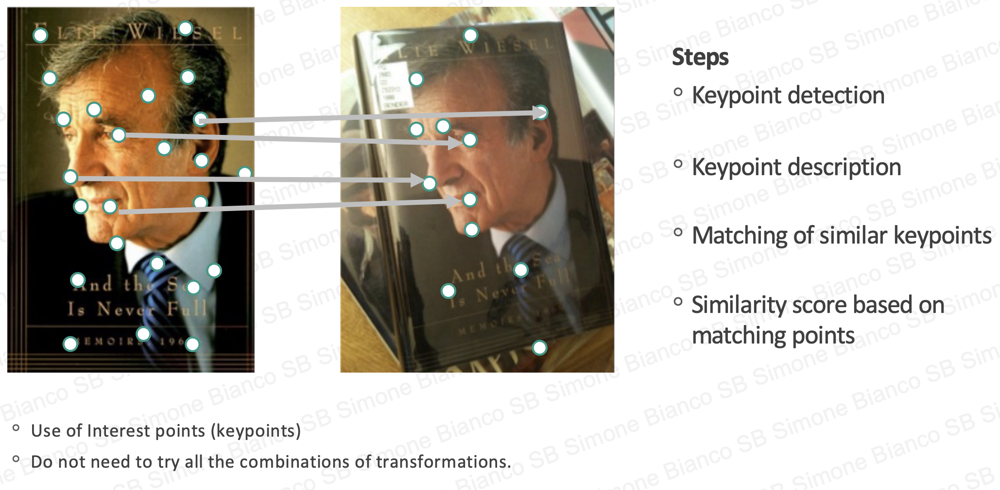

## Harris Corner Detector:

Which are the patches that generates a large variation when moved around? They can be found like this:  

$$ E(u,v) = \sum_{x,y}w(x,y) [I(x+u,y+v)- I (x,y)]^2$$  

$E$ is the difference between the original and the moved window  

$u$ is the window's displacement in the x direction  

$v$ is the window's displacement in the y direction  

$w(x,y)$ is the windows at position $(x,y)$• This acts like a mask, ensuring that the only desired window is used  

$I$ is the intensity of the image at a position $(x,y)$

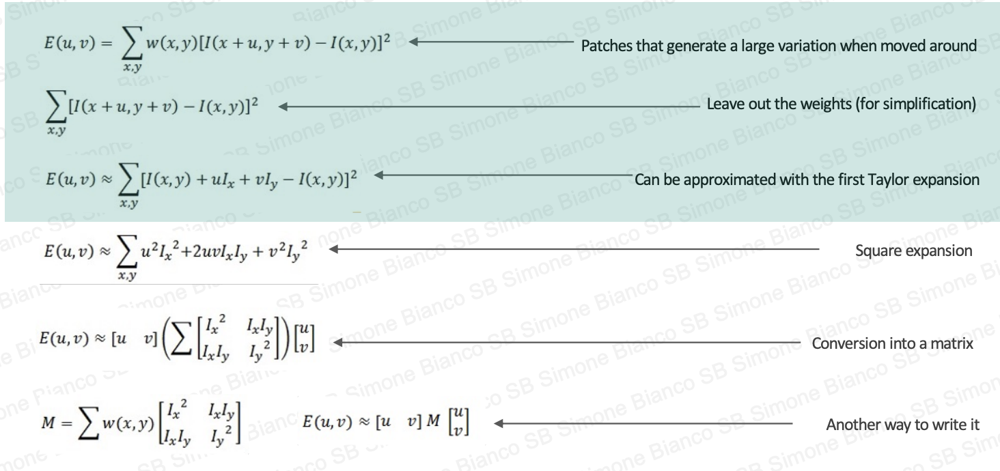

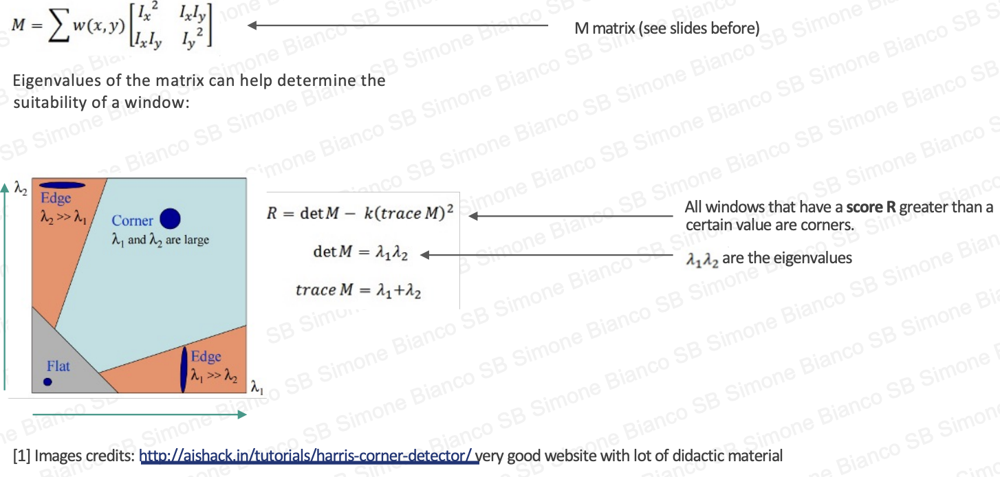

## Sift  



It's a keypoint detector like Harris, but also a Keypoint description, and it's robust to:
- Scale
- Rotation
- Illumination
- Viewpoint

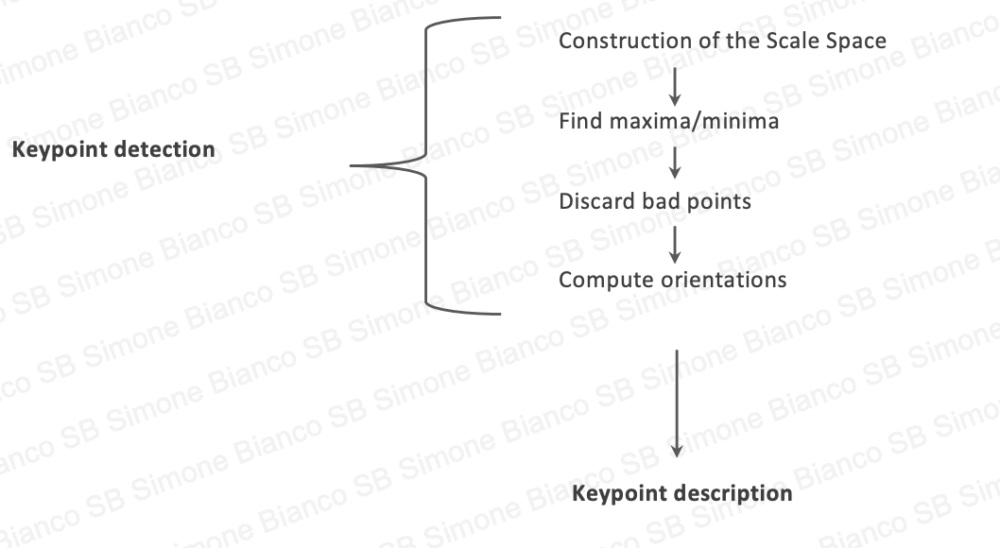

Scale the space is needed to obtain Scale Invariance, augmenting the blur automatically means augmenting the scales, this is repeated several times (octaves)

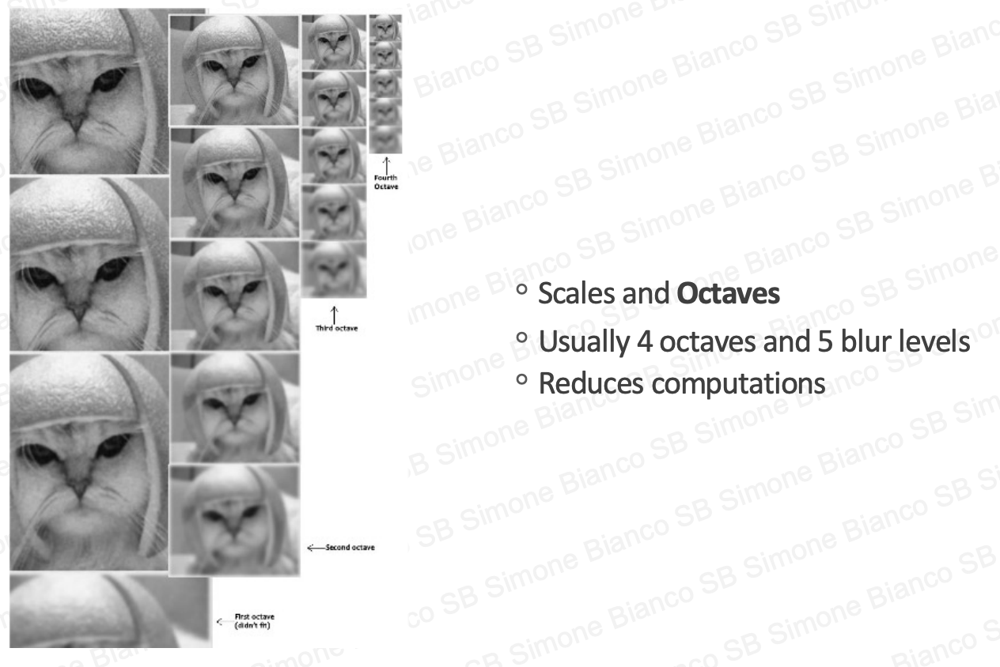

### Difference of Gaussians

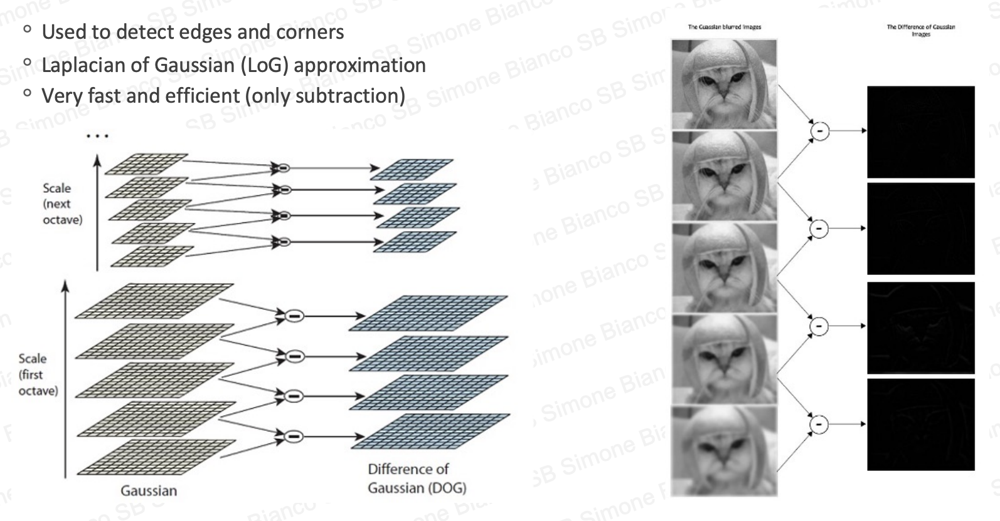

Then we have to locate maxima/minima in DoG images

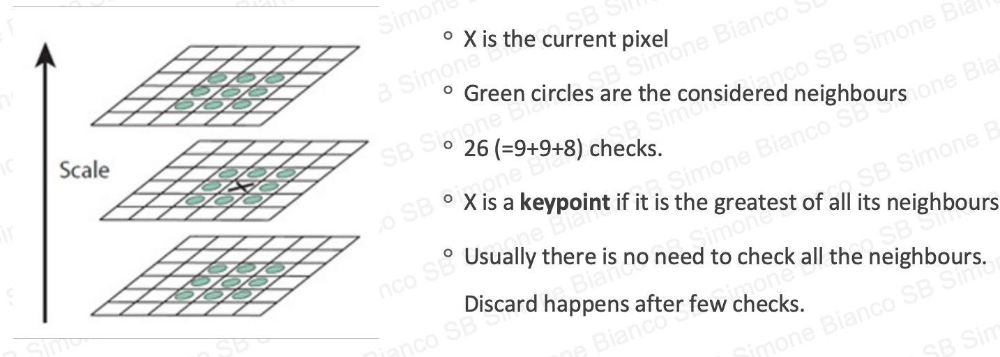

Then we have to do some refinements, in this case the central point is bigger than the the neighbours

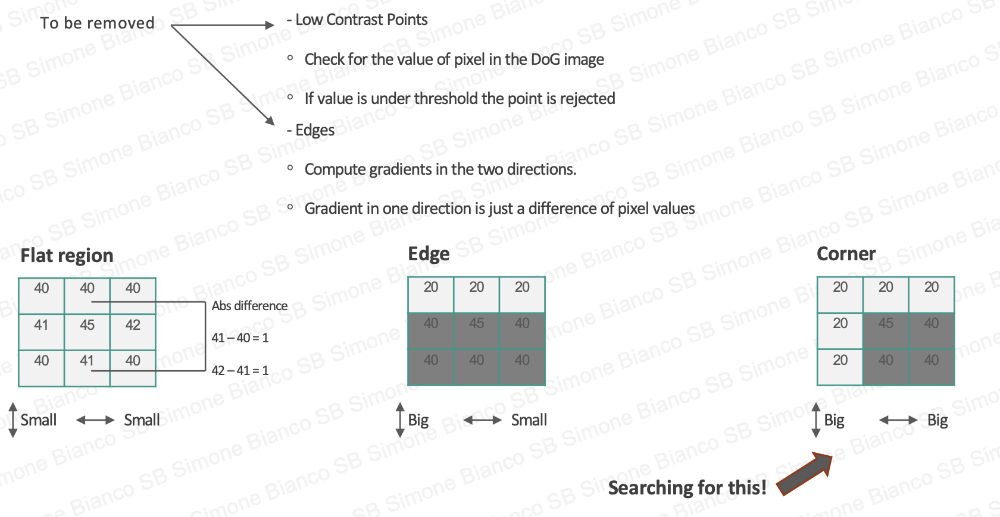

We crate an HIstogram of gradients:

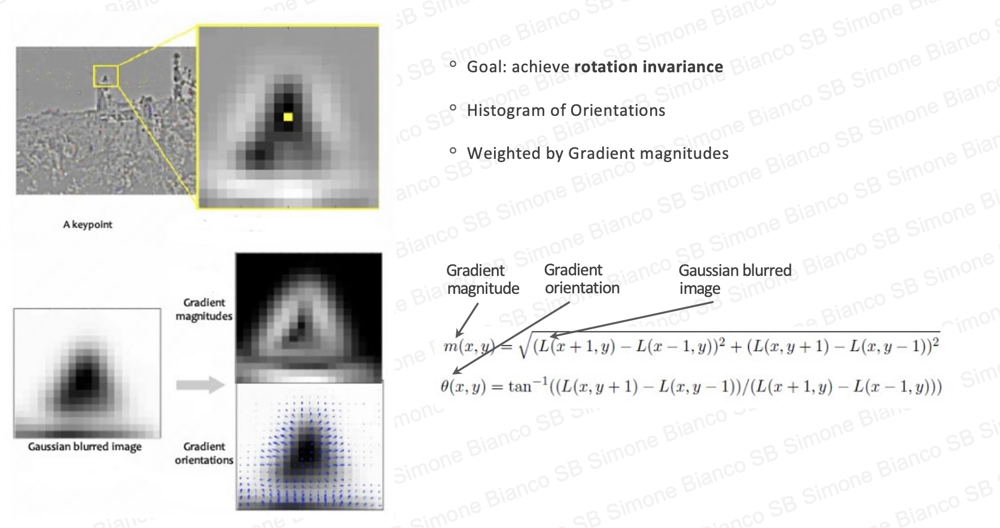

We use the histogram to understand where the corners are

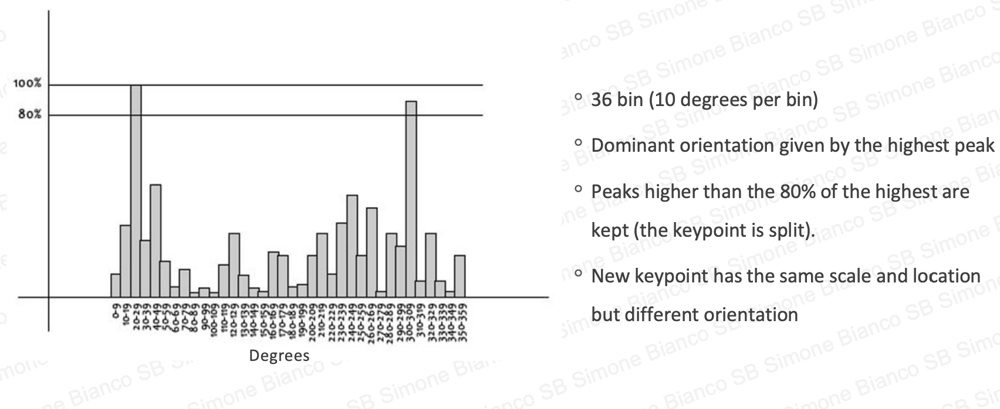

### Keypoint Description

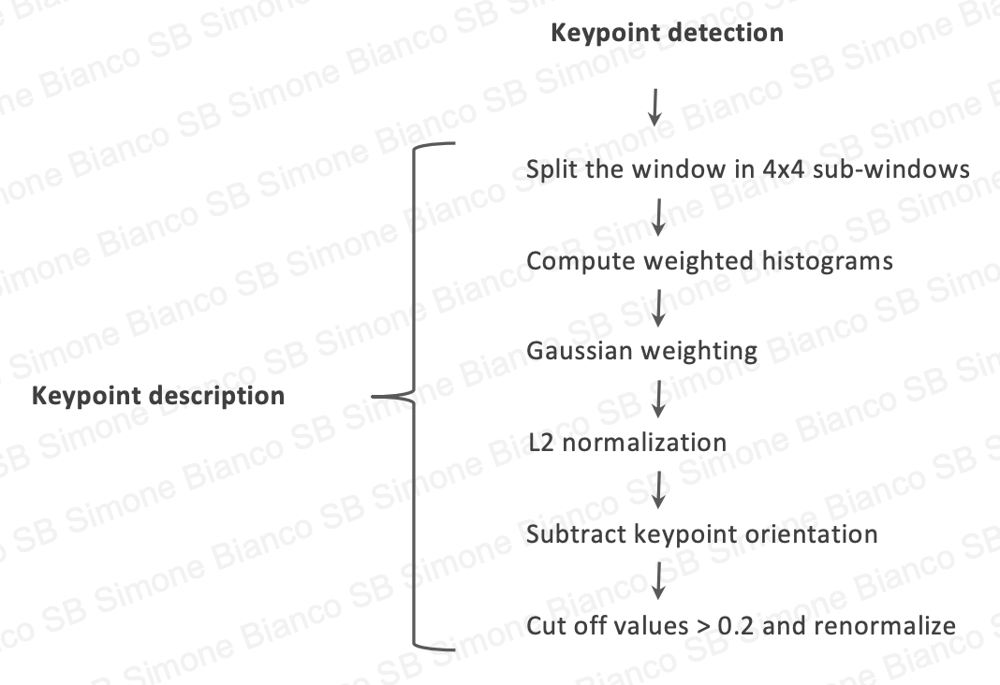

red is my current point, I take a windows of patches and divide it in a grid of 16 patches, then for each one we are consulting our Gradient Histogram of the edge direction and I oncatenate everything

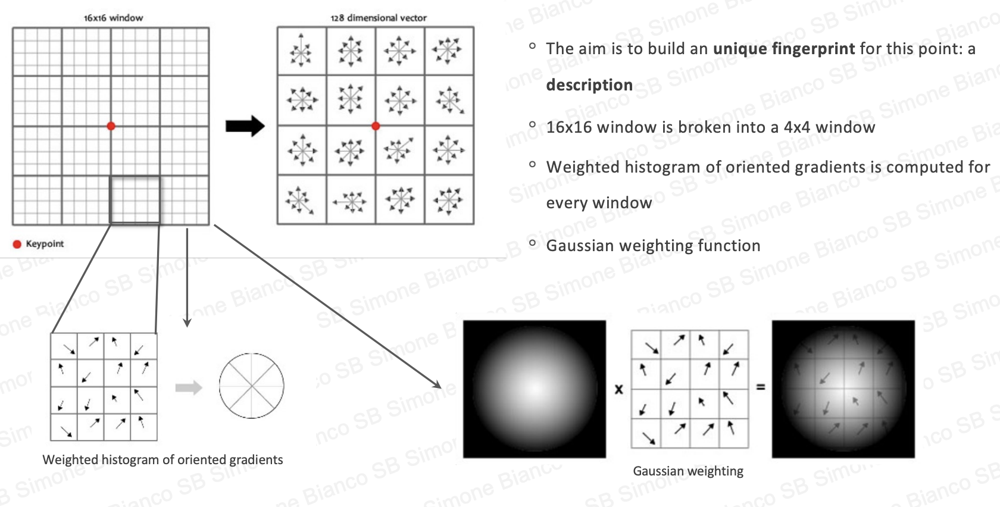

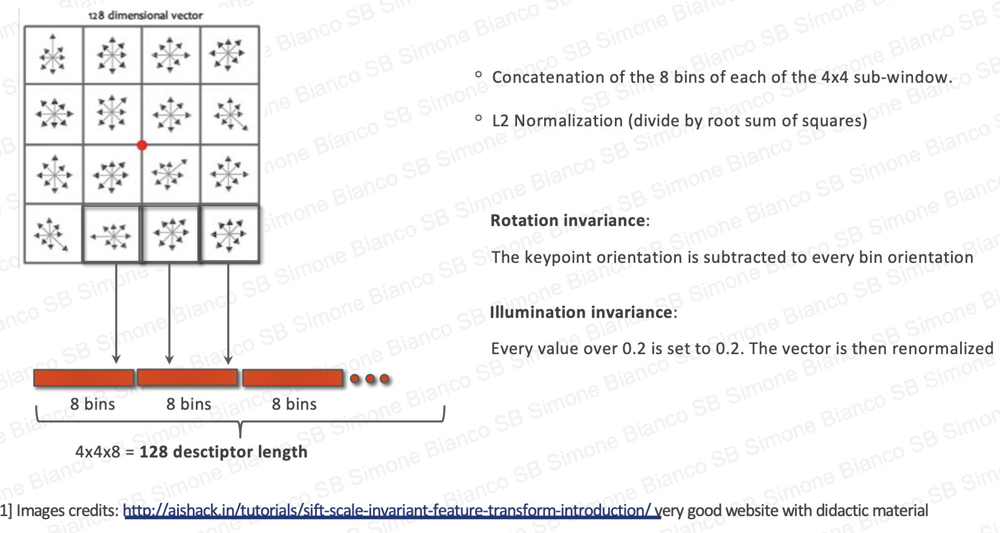

#### Homography
The stitching of multiple images is done using **Homography**, we need homogeneous coordinates, the algorithm used to do this is **RANSAC** (RANdom SAmple Consensus)  
Since it's a voting system, it is robust to outliers, only the main line which has more votes remain, it's robust even if the majority of points are outliers.

## Final overview of the complete pipeline

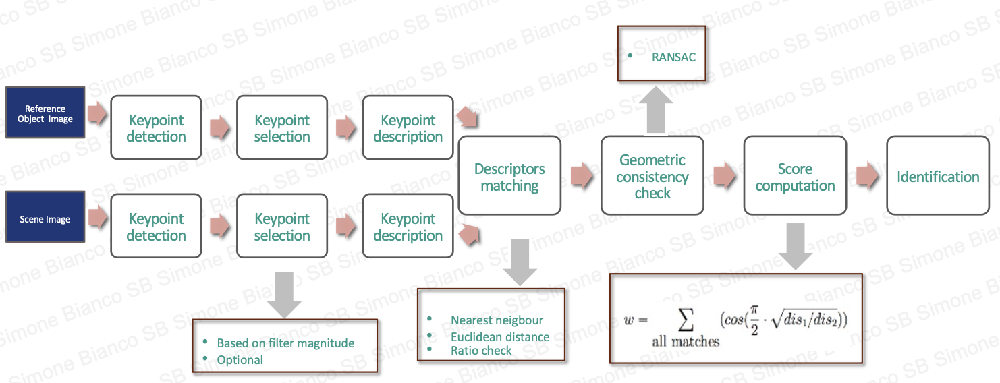

## Performance evaluation:

Intersection over Union of bounding boxes:

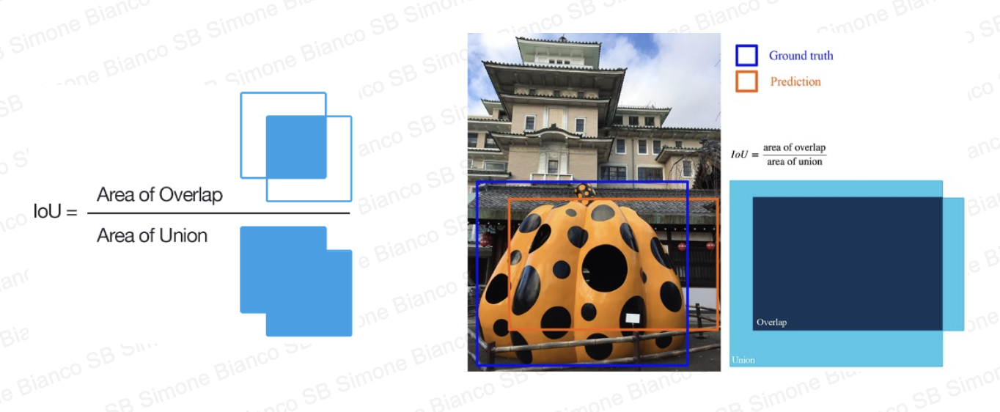

If we set a threshold, we can classify the performance as true positive, false positive, true negative and false negative